# Karplus-Strong sinteza zvuka

#### 1. Odrediti funkciju prenosa za osnovna blok šemu Karplus-Strong sintetizatora prikazanog na slici 1
    
   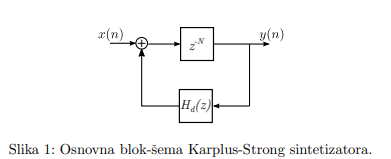

   Funkciju prenosa generalno određujemo kao proizvod izlaznog i ulaznog sistema, to jeste, po formuli $H(Z)=\frac{\displaystyle Y(Z)}{\displaystyle X(Z)} $ 
   
   U ovom specifičnom slučaju, funkciju prenosa određujemo kao funkciju prenosa složenog sistema koji se sastoji od zbira ulaznog signala i izlaznog signala u povratnoj sprezi, pomnoženog sa funckijom $H_{d}(Z)$, a zatim i kašnjenja tog sabranog sistema za $Z^{-N} $ u direktnoj grani
   
   Funckija $H_{d}(Z)$ je definisana na sljedeći način $H_{d}(Z)=\frac{\displaystyle 1+z^{-1}}{\displaystyle 2}$ 
   
   Ukoliko sa date slike napišemo analitčki oblik sistema, dobijamo $y(n)=x(n-N)+\frac{\displaystyle 1} {\displaystyle 2}y(n-N)+\frac{\displaystyle 1}{\displaystyle 2}y(n-N-1)$
   
   Na ovaj izraz ćemo primjeniti Z transformaciju.
   
   $$Y(Z)=X(Z)z^{-N}+\frac{\displaystyle 1} {\displaystyle 2}Y(Z)z^{-N}+\frac{\displaystyle 1}{\displaystyle 2}Y(Z)z^{-N-1}$$
   
   Sada ćemo prebaciti sve ulaze na jednu (X(Z)) i sve izlaze na drugu (Y(Z)) stranu
   
  $$Y(Z)-\frac{\displaystyle 1} {\displaystyle 2}Y(Z)z^{-N}-\frac{\displaystyle 1}{\displaystyle 2}Y(Z)z^{-N-1}=X(Z)z^{-N}$$
   
   Izvući ćemo Y(Z) i X(Z) ispred zagrade
   
   $$Y(Z)[1 - \frac{\displaystyle 1} {\displaystyle 2}z^{-N}-\frac{\displaystyle 1}{\displaystyle 2}z^{-N-1}]=X(Z)z^{-N}$$
   
   Znamo da se funkcija prenosa određuje pomoću formule $H(Z) = \frac{\displaystyle Y(Z)}{\displaystyle X(Z)}$ i na taj način ćemo je i odrediti.
   
   $$H(Z) = \frac{\displaystyle Y(Z)}{\displaystyle X(Z)} = \frac{\displaystyle z^{-N}}{\displaystyle 1 - \frac{\displaystyle 1} {\displaystyle 2}z^{-N}-\frac{\displaystyle 1}{\displaystyle 2}z^{-N-1}}$$
   
   Kada ovu formulu malo uredimo, dobijamo sljedeće  $ H(Z) = \frac{\displaystyle z^{-N}}{ \displaystyle 1 -  \frac{\displaystyle 1+z^{-1}} {\displaystyle 2}z^{-N}} $ 
   
   Sa ovim izrazom možemo provjeriti tačnost izračunate funckije prenosa, jer je funckija prenosa u složenim sistemima jednaka $H(Z) = \frac{\displaystyle H_{d}(Z)}{\displaystyle 1 - H_{d}(Z)H_{p}(Z)}$, gdje je $H_{d}(Z)$ izraz u direktnoj grani, a $H_{p}(Z)$ izraz u povratnoj grani.
   
   U slučaju ovog sistema $H_{d}(Z)=z^{-N}$, a $H_{p}(Z)=H_{d}(Z)=\frac{\displaystyle 1+z^{-1}}{\displaystyle 2}$
   

####    2. Nacrtati amplitudnu i faznu karakteristiku sistema za sintezu tona A iz četvrte oktave čija je frekvencija 440 Hz i  frekvenciju odmjeravanja od 48 kHz. Frekvencijsku osu označiti u Hercima. Polazeći od znanja o obliku spektra pobudnog  signala (bijeli šum), komentarisati zašto je ovaj sistem pogodan za sintezu tonova.


Na osnovu formule $ F_{0} = \frac {\displaystyle F_{S}} {\displaystyle N + \frac {\displaystyle 1} {\displaystyle 2}} $
možemo da odredimo potrebnu dužinu linije za kašnjenje, pa tako dobijamo formulu $ N = \frac {\displaystyle F_{S} - \frac {\displaystyle 1}{\displaystyle 2}F_{0}} {\displaystyle F_{0}} $

Pomoću ove formule možemo da odredimo N kada uvrstimo vrijednosti osnovne frekvencije, $F_{0}=440 Hz$, i frekvencije odmjeravanja, $F_{S}=48 000 Hz$

$$ N = \frac {\displaystyle 48000 - \frac {\displaystyle 1}{\displaystyle 2} * 440} {\displaystyle 440} = 108.5909090909$$

Dužina linije za kašnjenje mora biti pozitivna cijelobrojna i iz tog razloga ćemo uzeti da je $N=109$

Frekvencijsku karakteristiku možemo dobiti iz funkcije prenosa ukoliko izvršimo smjenu $z^{N}=e^{jw}$ , pa dobijamo 

   $$H(e^{jw}) = \frac{\displaystyle Y(e^{jw})}{\displaystyle X(e^{jw})} = \frac{\displaystyle e^{-jwN}}{\displaystyle 1 - \frac{\displaystyle 1} {\displaystyle 2}e^{-jwN}-\frac{\displaystyle 1}{\displaystyle 2}e^{-jw(N+1)}}$$


C:\Users\User\.conda\envs\odos\lib\site-packages\scipy\signal\_filter_design.py:480: RuntimeWarning: divide by zero encountered in divide
  h = (npp_polyval(zm1, b, tensor=False) /
C:\Users\User\.conda\envs\odos\lib\site-packages\scipy\signal\_filter_design.py:480: RuntimeWarning: invalid value encountered in divide
  h = (npp_polyval(zm1, b, tensor=False) /


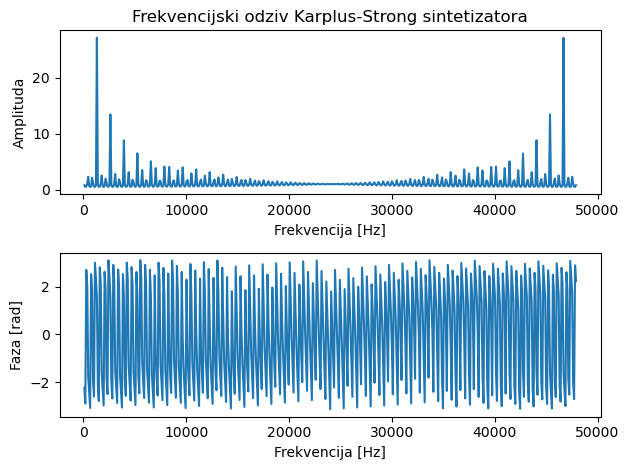

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import freqz

# Parametri
f0 = 440  # Frekvencija tona (A4)
fs = 48000  # Frekvencija odmjeravanja u Hz

N = 109  # Kašnjenje u uzorcima

# Koeficijenti frekvencijske karakteristike
b = np.zeros(N + 2)
b[N] = 1

a = np.zeros(N + 2)
a[0] = 1
a[N] = -0.5
a[N + 1] = -0.5

# Frekvencijski odziv
w, h = freqz(b, a, worN=512, whole=True)
# Plotovanje frekvencijske karakteristike
plt.figure()

# Amplitudni odziv
plt.subplot(2, 1, 1)
plt.plot((w*fs) /(2*np.pi),  np.abs(h))
plt.title('Frekvencijski odziv Karplus-Strong sintetizatora')
plt.xlabel('Frekvencija [Hz]')
plt.ylabel('Amplituda')

# Fazni odziv
plt.subplot(2, 1, 2)
plt.plot((w*fs) /(2*np.pi), np.angle(h))
plt.xlabel('Frekvencija [Hz]')
plt.ylabel('Faza [rad]')
plt.tight_layout()
plt.show()

Frekvencijsku osu dobijamo pomoću formule $f=\frac{\displaystyle \omega*f_{S}}{\displaystyle 2\pi}$, gdje je $\displaystyle \omega$ digitalna učestanost, a $f_{s}$ je frekvencija odmjeravanja.

Bijeli šum ima ravnomjernu raspodelu energije preko svih frekvencija. Kroz iterativni proces odlaganja i filtriranja, spektar bijelog šuma se transformiše tako da sadrži dominantne frekvencije koje su bliske harmonijskim tonovima.
Ovaj proces transformacije spektra omogućava Karplus-Strong algoritmu da generiše tonove koji imaju bogat harmonijski sadržaj, što ih čini zvučno prijatnim i muzički korisnim.
Ukratko, Karplus-Strong algoritam je pogodan za sintezu tonova jer efikasno koristi bijeli šum kao početni signal i transformiše ga u harmonijske tonove putem iterativnog procesa odlaganja i filtriranja, proizvodeći bogate i muzički prijatne zvučne rezultate.


#### 3. Napisati funkciju u Pythonu koja, korištenjem Karplus-Strong algoritma, generiše ton zadate frekvencije (u Hercima) i trajanja (u sekundama) za datu frekvenciju odmjeravanja (u Hercima).

Da bismo generisali ton pomoću Karplus-Strong sintetizatora, kao najjednostavnije rješenje koristićemo usrednjavanje u dvije tačke u povratnoj grani, sa filtrom oblika $H_{d}(Z)=\frac{\displaystyle 1+z^{-1}}{\displaystyle 2}$, te ćemo odrediti izlaz

Polazeći od blok šeme Karplus-Strong sintetizatora (slika 1), možemo da izračunamo izlaz kao 

$$Y(z) = [X(z) + H_{d}(z)*Y(z)]*z^{-N} $$

$$Y(z) = [X(z) + \frac{\displaystyle 1+z^{-1}}{\displaystyle 2}*Y(z)]*z^{-N} $$

Sređivanjem dobijamo <br>

$$Y(z) = X(z)*z^{-N} + \frac{\displaystyle 1}{\displaystyle 2}*Y(z)*z^{-N} + \frac{\displaystyle 1}{\displaystyle 2}*Y(z)*z^{-N-1} $$


Sad, kad pređemo u diskretni vremenski domen iz Z domena, dobijamo

$$y(n)=x(n-N)+\frac{\displaystyle 1} {\displaystyle 2}y(n-N)+\frac{\displaystyle 1}{\displaystyle 2}y(n-N-1)$$


In [2]:
import numpy as np



def karplus_strong_basic(f0, trajanje, fs):
    
    # Izračunavanje dužine odlaganja (broj uzoraka)
    N = int((fs-0.5*f0) / f0)

    # Inicijalizacija bafera sa bijelim šumom
    x = np.random.uniform(-1, 1, N)

    # Kreiranje izlaznog niza
    y = np.zeros(int(fs * trajanje))
    y[:N] = x

    # Karplus-Strong algoritam sa filtrom koji usrednjava u dvije tacke
    for i in range(N, int(fs * trajanje)):
        y[i] = 0.5 * y[i - N] + 0.5 * y[i - N - 1]
    
    return y



#### 4. Testirati funkciju iz prethodne tačke na primjeru generisanja tona A iz četvrte oktave. Koristiti frekvenciju         odmjeravanja od 48 kHz. Reprodukovati ton. Trajanje tona treba da bude 1 sekunda. Nacrtati talasni oblik generisanog signala (kao kontinualni signal) sa vremenskom osom označenom u sekundama. Nacrtati amplitudni spektar generisanog signala sa frekvencijskom osom označenom u Hercima.

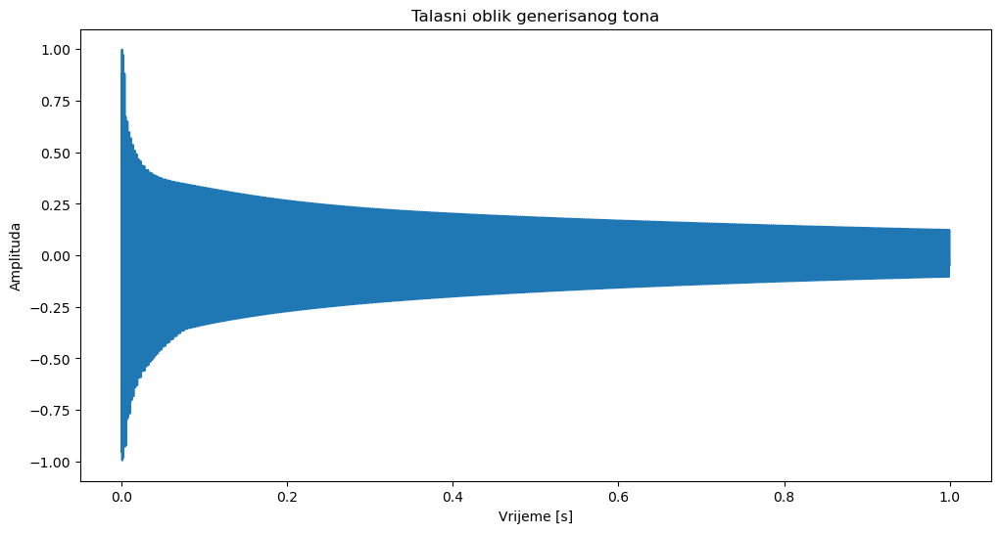

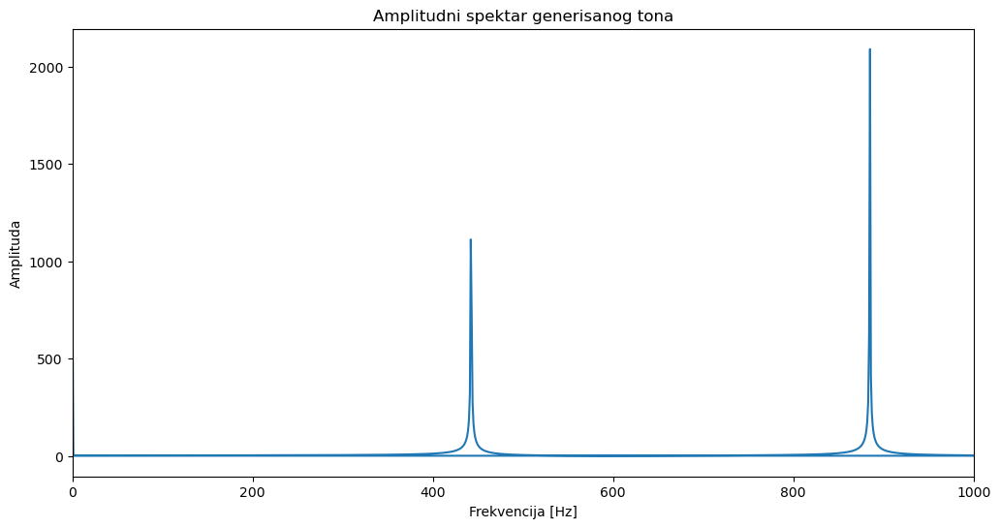

In [3]:
import matplotlib.pyplot as plt
from scipy.fftpack import fft, fftfreq

# Primjer korištenja funkcije
f0 = 440  # Frekvencija tona (A4)
trajanje = 1  # Trajanje tona u sekundama
fs = 48000  # Frekvencija odmjeravanja (Hz)


ton = karplus_strong_basic(f0, trajanje, fs)

# Plotovanje talasnog oblika i spektra 
vrijeme = np.linspace(0, trajanje, int(fs * trajanje))
plt.figure(figsize=(12, 6))
plt.plot(vrijeme, ton)
plt.title('Talasni oblik generisanog tona')
plt.xlabel('Vrijeme [s]')
plt.ylabel('Amplituda')
plt.show()


# Plotovanje spektra
fft_spektar = np.fft.fft(ton)
frekvencije = np.fft.fftfreq(len(ton), 1/fs)

plt.figure(figsize=(12, 6))
plt.plot(frekvencije, np.abs(fft_spektar))
plt.xlim([0,1000])
plt.title('Amplitudni spektar generisanog tona')
plt.xlabel('Frekvencija [Hz]')
plt.ylabel('Amplituda')
plt.show()

In [4]:
from scipy.io import wavfile
from IPython.display import Audio

wavfile.write('ton_A.wav', fs, ton)

# Reprodokovanje tona A
fs, ton_A = wavfile.read('ton_A.wav')
Audio(ton_A, rate=fs)

Na grafiku talasnog oblika generisanog tona vidimo da ton nije u potpunosti prigušen i da će se njegovo trajanje produžiti i nakon 1s. Razlog za to je što u povratnoj sprezi korisitmo usrednjavanje u samo dvije tačke, te će visoki tonovi trajati veoma kratko, a duboki neprirodno dugo. 
Da bismo riješili ovaj problem potrebno je u povratnoj grani koristiti filtar oblika  $H_{d}(z)=\rho*[(1-S) + S*z^{-1}]$

#### 5. Napisati kod u Pythonu koji, korištenjem funkcije iz tačke 3, generiše C-dur ljestvicu. Frekvencije tonova i formulu za njihovo izračunavanje možete naći na https://en.wikipedia.org/wiki/Piano_key_frequencies. Reprodukovati generisani signal i sačuvati ga u WAV fajlu. Kolike su stvarne frekvencije tonova ljestvice generisanih realizovanim sintetizatorom?


C-dur ljestvica se sastoji od 8 tonova, C4, D4, E,4, F4, G4, A4, B4 i C5, a njihove frekvencije su:

C4= 261.6256 <br>
D4=293.6648 <br>
E4=329.6276 <br>
F4=349.2282 <br>
G4=391.9954 <br>
A4=440.0000 <br>
B4=493.8833 <br>
C5=523.2511 <br>


In [5]:
f0_c_dur= np.array([261.6256, 293.6648, 329.6276, 349.2282, 391.9954, 440.0000, 493.8833, 523.2511])

ljestvica= [] #Definišemo ljestvicu kao prazan niz, 
              #da ne bi došlo do konkatenacije prethodno generisanih tonova sa novim tonovima 

for i in range (len(f0_c_dur)):
    ton=karplus_strong_basic(f0_c_dur[i], trajanje, fs)
    ljestvica=np.append(ljestvica, ton, axis=None)
    
wavfile.write('C_dur_ljestvica.wav', fs, ljestvica)

fs,c_dur=wavfile.read('C_dur_ljestvica.wav')
Audio(c_dur, rate=fs)
      

#### 6. Napisati funkciju u Pythonu kojom je implementiran Karplus-Strong sintetizator sa filtrom u grani povratne sprege    kojim je moguće kontrolisati trajanje tona. Pored zadate frekvencije tona, njegovog trajanja i frekvencije odmjeravanja, ulazni argumenti ove funkcije treba da budu i parametri t60 i S koje su parametri filtra u povratnoj sprezi.

Da bismo uticali na trajanje tona, umjesto usrednjavanja u dvije tačke u povratnoj grani, koristićemo filtar oblika $H_{d}(z)=\rho*[(1-S) + S*z^{-1}]$, gdje je $\rho = 0.001^{\frac {\displaystyle 1} {\displaystyle F_{0}*t_{60}}}$, te ćemo odrediti izlaz.

Polazeći od blok šeme Karplus-Strong sintetizatora (slika 1), možemo da izračunamo izlaz kao 

$$Y(z) = [X(z) + H_{d}(z)*Y(z)]*z^{-N} $$

$$Y(z) = [X(z) + \rho*[(1-S) + S*z^{-1}]*Y(z)]*z^{-N} $$

$$Y(z) = X(z)*z^{-N} + \rho*[(1-S) + S*z^{-1}]*Y(z)*z^{-N} $$

$$Y(z) = X(z)*z^{-N} + \rho*(1-S)*Y(z)*z^{-N} + \rho*S*Y(z)*z^{-N-1} $$

Sad, kad pređemo u diskretni vremenski domen iz Z domena, dobijamo

$$y(n) = x(n-N) + \rho*(1-S)*y(n-N) + \rho*S*y(n-N-1) $$


In [6]:
import numpy as np



def karplus_strong(f0, trajanje, fs, t60, S):
    
    # Izračunavanje dužine odlaganja (broj uzoraka)
    N = int((fs-0.5*f0) / f0)
    
    # Izračunavanje parametra rho
    rho = 0.001 ** (1 / (f0 * t60))

    # Inicijalizacija bafera sa bijelim šumom
    x = np.random.uniform(-1, 1, N)

    # Kreiranje izlaznog niza
    y = np.zeros(int(fs * trajanje))
    y[:N] = x

    # Karplus-Strong algoritam sa filtrom za kontrolisanje trajanja tona
    for i in range(N, int(fs * trajanje)):
        y[i] = rho * ((1 - S) * y[i - N] + S * y[i - N - 1])
    
    return y


#### 7. Demonstrirati uticaj parametara t60 i S na trajanje tonova C-dur ljestvice.

Testiraćemo prvo uticaj parametra S, na tonu C4 (grafički) i generisaćemo C-dur ljestvicu sa različitim parametrima u wav fajlu.

C:\Users\User\AppData\Local\Temp\ipykernel_2740\2715489636.py:15: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(3,1,i+1)


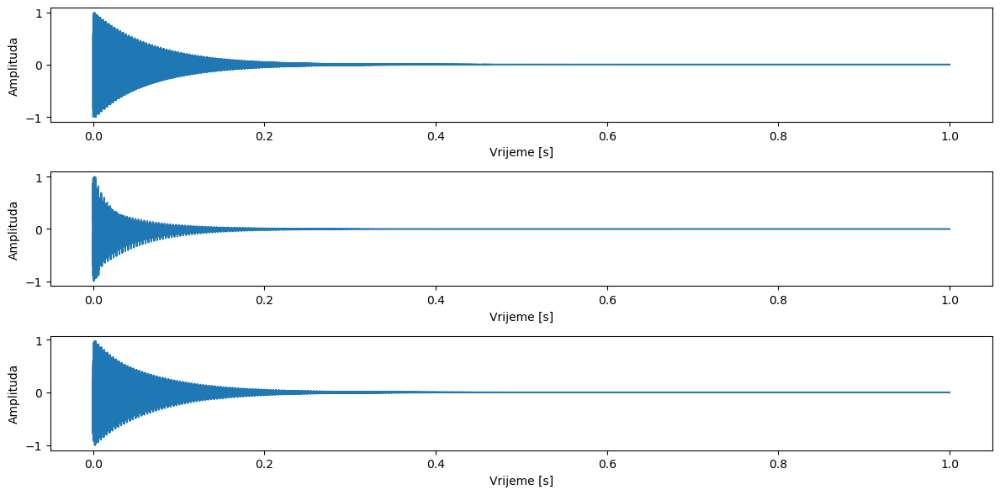

In [7]:
t60=0.5 #postavićemo parametar t60 na vrijednost 0.5, to jeste, da za pola sekunde jačina tona padne za 60dB
S= np.array([ 0.01, 0.5, 0.99 ])

ton_C4=[0]*len(S)

for i in range (len(S)):
    ton_C4[i]=karplus_strong(f0_c_dur[1], 1, fs, t60, S[i])

vrijeme = np.linspace(0, trajanje, int(fs * trajanje))

plt.figure(figsize=(12, 6))
plt.title('Uticaj parametra S na duzinu trajanja tona')

for i in range (len(S)):
    plt.subplot(3,1,i+1)
    plt.plot(vrijeme,ton_C4[i])
    plt.xlabel('Vrijeme [s]')
    plt.ylabel('Amplituda')
    
plt.tight_layout()
plt.show()
  



In [8]:
ljestvica1=[]



for i in range(len(f0_c_dur)):
    ton=karplus_strong(f0_c_dur[i], trajanje, fs, t60, S[0])
    ljestvica1=np.append(ljestvica1, ton, axis=None)

    
wavfile.write('C_dur_ljestvicaS_001.wav', fs, ljestvica1)

fs,c_dur001=wavfile.read('C_dur_ljestvicaS_001.wav')
Audio(c_dur001, rate=fs)

In [9]:
ljestvica2=[]


for i in range(len(f0_c_dur)):
    ton=karplus_strong(f0_c_dur[i], trajanje, fs, t60, S[1])
    ljestvica2=np.append(ljestvica2, ton, axis=None)
    
wavfile.write('C_dur_ljestvicaS_05.wav', fs, ljestvica2)

fs,c_dur05=wavfile.read('C_dur_ljestvicaS_05.wav')
Audio(c_dur05, rate=fs)

In [10]:
ljestvica3=[]
    
for i in range(len(f0_c_dur)):
    ton=karplus_strong(f0_c_dur[i], trajanje, fs, t60, S[2])
    ljestvica3=np.append(ljestvica3, ton, axis=None)
    
    
wavfile.write('C_dur_ljestvicaS_099.wav', fs, ljestvica3)

fs,c_dur099=wavfile.read('C_dur_ljestvicaS_099.wav')
Audio(c_dur099, rate=fs)

Sada ćemo testirati uticaj parametra t60, ponovo, na tonu C4 (grafički) i generisaćemo C-dur ljestvicu sa različitim parametrima u wav fajlu.

C:\Users\User\AppData\Local\Temp\ipykernel_2740\1791376054.py:15: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(3,1,i+1)


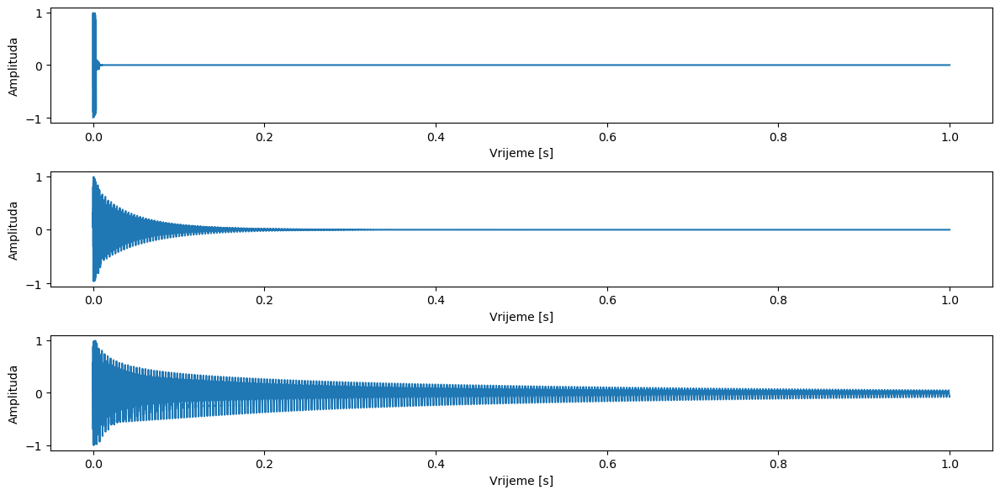

In [11]:
S=0.5 #postavićemo parametar S na vrijednost 0.5, na kojoj ton ima najkreće trajanje
t60= np.array([ 0.01, 0.5, 5])

ton_C4=[0]*len(t60)

for i in range (len(t60)):
    ton_C4[i]=karplus_strong(f0_c_dur[1], 1, fs, t60[i], S)

vrijeme = np.linspace(0, trajanje, int(fs * trajanje))

plt.figure(figsize=(12, 6))
plt.title('Uticaj parametra t60 na duzinu trajanja tona')

for i in range (len(t60)):
    plt.subplot(3,1,i+1)
    plt.plot(vrijeme,ton_C4[i])
    plt.xlabel('Vrijeme [s]')
    plt.ylabel('Amplituda')

plt.tight_layout()
plt.show()



In [12]:
ljestvica1=[]



for i in range(len(f0_c_dur)):
    ton=karplus_strong(f0_c_dur[i], trajanje, fs, t60[0], S)
    ljestvica1=np.append(ljestvica1, ton, axis=None)

    
wavfile.write('C_dur_ljestvica_t60_001.wav', fs, ljestvica1)

fs,c_dur001=wavfile.read('C_dur_ljestvica_t60_001.wav')
Audio(c_dur001, rate=fs)

In [13]:
ljestvica2=[]



for i in range(len(f0_c_dur)):
    ton=karplus_strong(f0_c_dur[i], trajanje, fs, t60[1], S)
    ljestvica2=np.append(ljestvica2, ton, axis=None)

    
wavfile.write('C_dur_ljestvica_t60_05.wav', fs, ljestvica2)

fs,c_dur05=wavfile.read('C_dur_ljestvica_t60_05.wav')
Audio(c_dur05, rate=fs)

In [14]:
ljestvica3=[]



for i in range(len(f0_c_dur)):
    ton=karplus_strong(f0_c_dur[i], trajanje, fs, t60[2], S)
    ljestvica3=np.append(ljestvica3, ton, axis=None)

    
wavfile.write('C_dur_ljestvica_t60_5.wav', fs, ljestvica3)

fs,c_dur5=wavfile.read('C_dur_ljestvica_t60_5.wav')
Audio(c_dur5, rate=fs)

<b> Zaključak: </b> <br>
<u> Uticaj parametra S: </u> <br>
    Parametar S je uvijek na intervalu 0<S<1. Ukoliko je S=0.5, trajanje tona je najkraće, a ukoliko se vrijednost približava       0, u našem primjeru S=0.01, ili se približava 1 (S=0.99), vrijednost tona se produžava <br>
<u>Uticaj parametra $t_{60}$ </u> <br>
Parametar $t_{60}$ utiče na parametar $\rho$, koji se nalazi na intervalu 0<$\rho$<1, a utiče na način da, što je $t_{60}$ manje, manja je i vrijednost $\rho$, a ukoliko je $t_{60}$ veliko, vrijednost parametra $\rho$ je takođe velika. Dalje, ukoliko je $\rho$ veoma malo ($t_{60}$=0.01), dužina signala je skoro pa zanemarljiva, a ukoliko je $\rho$ veliko ($t_{60}$=5), onda je trajanje tona primjetno veće.

#### 8. Položaj trzalice na žicama se može kontrolisati tako što se kao pobudni signal ne koristi bijeli šum već signal        dobijen filtriranjem bijelog šuma češljastim FIR filtrom čija je funkcija prenosa prikazana na slici 2. Modifikovati funkciju iz tačke 6 tako da se ulazni signal prvo filtrira češljastim FIR filtrom. Parametar β treba da bude dodatni    ulazni argument ove funkcije, pored već postojećih.

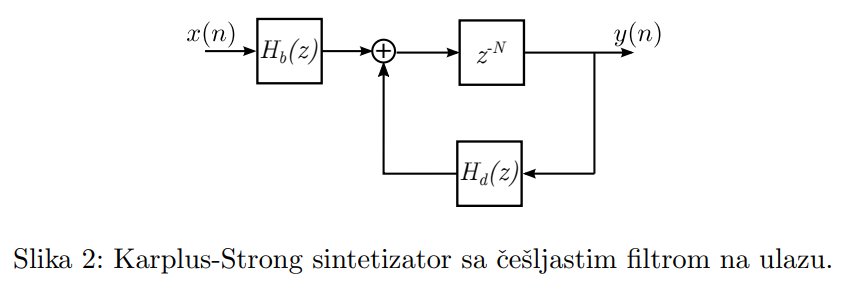

Funkcija prenosa datog filtra je $H_{b}(z)=1-z^{\lfloor{\beta N}\rfloor}$ <br>
Njegov uticaj na ulazni signal možemo odrediti u diksretnom vremenskom domenu, kao konvoluciju ulaznog signala i FIR filtra. Da bismo to uradili, prvo trebamo da funkciju prenosa filtra zapišemo u diskretnom vremenskom domenu. <br>
$H_{b}(z)=1-z^{\lfloor{\beta N}\rfloor}$ <i>$\displaystyle /Z^{-1}$</i>
$$H_{b}(n)= \delta(n)- \delta(n-\lfloor{\beta N}\rfloor)$$
Sada možemo da uzmemo koeficijente ovog FIR filtra i upotrijebiti funkciju lfilter, u kojoj ćemo filtrirati bijeli šum uz pomoć češljastog filtra.


In [15]:
from scipy.signal import lfilter

def karplus_strong_filter(f0, trajanje, fs, t60, S, beta):
    
    
    # Izračunavanje dužine odlaganja (broj uzoraka)
    N = int((fs-0.5*f0) / f0)
    
    #Izračunavanje koeficijenata FIR filtra na ulazu
    b = np.zeros(N + 1)
    beta_floor = int(np.floor(beta * N))
    b[0] = 1
    b[beta_floor] = -1
    

    # Izračunavanje parametra rho
    rho = 0.001 ** (1 / (f0 * t60))

    # Inicijalizacija bijelog šuma
    bijeli_sum = np.random.uniform(-1, 1, N)
    
    #Inicijalizacija pobudnog signala
    x=lfilter(b, 1, bijeli_sum)
    
    # Kreiranje izlaznog niza
    y = np.zeros(int(fs * trajanje))
    y[:N] = x

    # Karplus-Strong algoritam sa FIR filtrom na ulazu i fitrom za kontrolisanje trajanja tona na izlazu
    for i in range(N, int(fs * trajanje)):
        y[i] = rho * ((1 - S) * y[i - N] + S * y[i - N - 1])
    
    return y


#### 9. Demonstrirati uticaj vrijednosti parametra β ∈ {0.01, 0.1, 0.5, 0.9} na tonove C-dur ljestvice.


In [16]:
beta= np.array([0.01, 0.1, 0.5, 0.9])

t60=3 
S= 0.01

ljestvica1=[]



for i in range(len(f0_c_dur)):
    ton=karplus_strong_filter(f0_c_dur[i], trajanje, fs, t60, S, beta[0])
    ljestvica1=np.append(ljestvica1, ton, axis=None)

    
wavfile.write('C_dur_ljestvica_beta_001.wav', fs, ljestvica1)

fs,c_dur001=wavfile.read('C_dur_ljestvica_beta_001.wav')
Audio(c_dur001, rate=fs)

In [17]:
ljestvica2=[]



for i in range(len(f0_c_dur)):
    ton=karplus_strong_filter(f0_c_dur[i], trajanje, fs, t60, S, beta[1])
    ljestvica2=np.append(ljestvica2, ton, axis=None)

    
wavfile.write('C_dur_ljestvica_beta_01.wav', fs, ljestvica2)

fs,c_dur01=wavfile.read('C_dur_ljestvica_beta_01.wav')
Audio(c_dur01, rate=fs)

In [18]:
ljestvica3=[]



for i in range(len(f0_c_dur)):
    ton=karplus_strong_filter(f0_c_dur[i], trajanje, fs, t60, S, beta[2])
    ljestvica3=np.append(ljestvica3, ton, axis=None)

    
wavfile.write('C_dur_ljestvica_beta_05.wav', fs, ljestvica3)

fs,c_dur05=wavfile.read('C_dur_ljestvica_beta_05.wav')
Audio(c_dur05, rate=fs)

In [19]:
ljestvica4=[]



for i in range(len(f0_c_dur)):
    ton=karplus_strong_filter(f0_c_dur[i], trajanje, fs, t60, S, beta[3])
    ljestvica4=np.append(ljestvica4, ton, axis=None)

    
wavfile.write('C_dur_ljestvica_beta_09.wav', fs, ljestvica4)

fs,c_dur09=wavfile.read('C_dur_ljestvica_beta_09.wav')
Audio(c_dur09, rate=fs)

Vidimo da je ton jako tanak i siromašan ako je $\beta$ jako malo. Što je beta veće, to je ton bogatiji i prirodniji.

Na ovaj način parametar $\beta$ kontroliše poziciju kašnjenja u češaljastom filteru, što utiče na karakteristike proizvedenog tona. Što je znači da, što je $\beta$ bliže 1, to će kašnjenje biti duže, a ton će imati izraženije odjeke i bogatiji spektralni sadržaj.

#### 10. Modifikovati funkciju iz tačke 8 tako da uključuje implementaciju overdrajv efekta sa pojačanjem g koje se može     zadati kao ulazni argument.

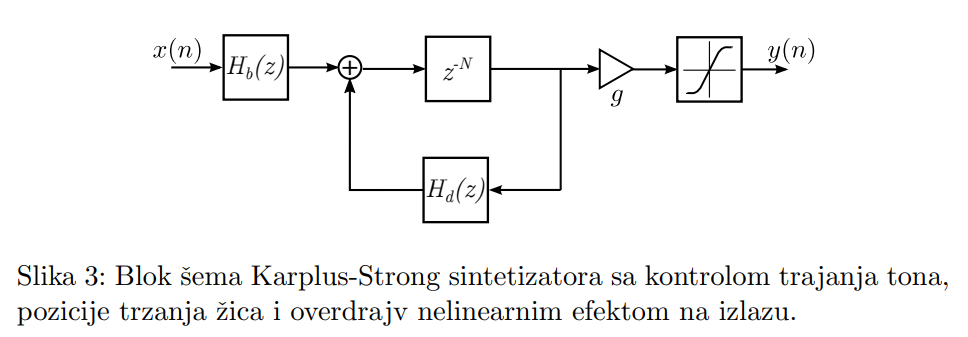

Gdje je statitčka karakteristika nelinearnog efekta data sa formulom
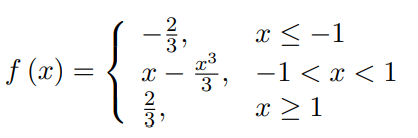

In [20]:
def karplus_strong_overdrive(f0, trajanje, fs, t60, S, beta, g):
    
    
    # Izračunavanje dužine odlaganja (broj uzoraka)
    N = int((fs-0.5*f0) / f0)
    
    #Izračunavanje koeficijenata FIR filtra na ulazu
    b = np.zeros(N + 1)
    beta_floor = int(np.floor(beta * N))
    b[0] = 1
    b[beta_floor] = -1
    

    # Izračunavanje parametra rho
    rho = 0.001 ** (1 / (f0 * t60))

    # Inicijalizacija bijelog šuma
    bijeli_sum = np.random.uniform(-1, 1, N)
    
    #Inicijalizacija pobudnog signala
    x=lfilter(b, 1, bijeli_sum)
    
    # Kreiranje izlaznog niza
    y_temp = np.zeros(int(fs * trajanje))
    y_temp[:N] = x

    # Karplus-Strong algoritam sa FIR filtrom na ulazu i fitrom za kontrolisanje trajanja tona na izlazu
    for i in range(N, int(fs * trajanje)):
        y_temp[i] = rho * ((1 - S) * y_temp[i - N] + S * y_temp[i - N - 1])
    
    
    # Pojačanje prije overdrive efekta
    y_temp_g = y_temp*g
    
    y=np.zeros(len(y_temp_g))
    
    # Overdrive nelinearni efekat
    for i in range(len(y_temp_g)):
        if y_temp_g[i] <= -1:
            y[i]= -2/3
        elif y_temp_g[i] >= 1:
            y[i]= 2/3
        else:

            y[i]= y[i] - (y[i]**3)/3
    
    return y


#### 11. Na tonovima C-dur ljestvice demonstrirati overdrajv efekat sa pojačanjem g = 1000 prije nelinearnosti (6).

In [21]:
t60=3 
S= 0.01
beta=0.5 
g=1000

ljestvica = []
for i in range(len(f0_c_dur)):
    ton=karplus_strong_filter(f0_c_dur[i], trajanje, fs, t60, S, beta)
    ljestvica=np.append(ljestvica, ton, axis=None)

    
wavfile.write('C_dur_ljestvica_prije_overdrive.wav', fs, ljestvica)

fs,c_dur=wavfile.read('C_dur_ljestvica_prije_overdrive.wav')
Audio(c_dur, rate=fs)

In [22]:
ljestvica1 = []
for i in range(len(f0_c_dur)):
    ton=karplus_strong_overdrive(f0_c_dur[i], trajanje, fs, t60, S, beta, g)
    ljestvica1=np.append(ljestvica1, ton, axis=None)

    
wavfile.write('C_dur_ljestvica_poslije_overdrive.wav', fs, ljestvica1)

fs,c_durO=wavfile.read('C_dur_ljestvica_poslije_overdrive.wav')
Audio(c_durO, rate=fs)

#### 12. Napisati funkciju koja korištenjem neke od funkcija iz tačaka 6, 8 ili 10 generiše akord koji se sastoji od tonova zadatih frekvencija. Akord na gitari se može posmatrati kao niz tonova odsviranih istovremeno uz malo kašnjenje početaka pojedinih tonova.

In [23]:
def karplus_strong_filter(f0, trajanje, fs, t60, S, beta):
    
    
    # Izračunavanje dužine odlaganja (broj uzoraka)
    N = int((fs-0.5*f0) / f0)
    
    #Izračunavanje koeficijenata FIR filtra na ulazu
    b = np.zeros(N + 1)
    beta_floor = int(np.floor(beta * N))
    b[0] = 1
    b[beta_floor] = -1
    

    # Izračunavanje parametra rho
    rho = 0.001 ** (1 / (f0 * t60))

    # Inicijalizacija bijelog šuma
    bijeli_sum = np.random.uniform(-1, 1, N)
    
    #Inicijalizacija pobudnog signala
    x=lfilter(b, 1, bijeli_sum)
    
    # Kreiranje izlaznog niza
    y = np.zeros(int(fs * trajanje))
    y[:N] = x

    # Karplus-Strong algoritam sa FIR filtrom na ulazu i fitrom za kontrolisanje trajanja tona na izlazu
    for i in range(N, int(fs * trajanje)):
        y[i] = rho * ((1 - S) * y[i - N] + S * y[i - N - 1])
    
    return y

def akord_generator(frekv, trajanje, fs, t60, S, beta, kasnjenje=0.01): #kašnjenje u milisekundima
    
    # Izračunavanje broja uzoraka
    N = int(fs*trajanje)
    
    akord=np.zeros(N)
    
    #Pretvaranje kašnjenja iz milisekudni u odmjerke 
    delay=int(kasnjenje * fs / 1000)
    
    for i, f in enumerate(frekv): 
        ton=karplus_strong_filter(f, trajanje, fs, t60, S,beta)
        start_sample = i * delay
        if start_sample < N:
            end_sample = min(start_sample + len(ton), N)
            akord[start_sample:end_sample] += ton[:end_sample - start_sample]
    
    
    return akord    

A-dur se sastoji od tonova A - C# - E. U primjeru ćemo ga generisati u trećoj oktavi 

In [24]:
adur3= np.array([220.00, 138.59, 164.81])
fs=48000
trajanje=2
t60=50
S= 0.01
beta=0.9

akord_adur3 = akord_generator(adur3, trajanje, fs, t60, S, beta)

wavfile.write('adur3.wav', fs, akord_adur3)

fs, adur3 = wavfile.read('adur3.wav')
Audio(adur3, rate=fs)

E-mol se sastoji od tonova E - G - B. U primjeru ćemo ga generisati u sedmoj oktavi

In [25]:
emol5= np.array([659.26, 783.99, 987.77])
fs=48000
trajanje=2
t60=50
S= 0.01
beta=0.9

akord_emol5 = akord_generator(emol5, trajanje, fs, t60, S, beta)

wavfile.write('emol5.wav', fs, akord_emol5)

fs, emol5 = wavfile.read('emol5.wav')
Audio(emol5, rate=fs)

#### 13. Korištenjem sintetizatora realizovanog u nekoj od tačaka 6, 8 ili 10 odsvirati kompletnu kompoziciju. Mogući primjeri su kompozicije sa http://arcadetones.emuunlim.com/, ali možete izabrati i sopstvenu.

Za testiranje realizovanog sintetizatora pomoću primjera koristićemo X-man arcade ringtone. Na stranici http://arcadetones.emuunlim.com/ringtones_r/xmen.html postoji Nokia RTTTL zapis ovog zvuka: <br>
xmen:d=4,o=6,b=140: <br>
16f#5,16g5,16b5,16d,c#,8b5,8f#5,p, <br>
16f#5,16g5,16b5,16d,c#,8b5,8g5,p, <br>
16f#5,16g5,16b5,16d,c#,8b5,8d,2p, <br>
8c#,8b5,2p, <br>
16b5,16e,16f#,16g,f#,8e,8b5,p, <br>
16b5,16e,16f#,16g,f#,8e,8c,p, <br>
16f#5,16g5,16b5,16d,c#,8b5,8d,2p, <br>
8c#,8b5,2p <br>

Da bismo iskoristili ovaj zapis potrebno je znati nekoliko stvari: <br>
Ovaj zapis se sastoji od 3 segmenta: <br>
1. segment: ime (xmen) <br>
2. segment: definisanje podrazumjevanih vrijednosti, gdje d označava dužinu trajanja tona, o označava oktavu i b označava broj bita po sekundi, to jeste, takt. U našem primjeru trajanje je 4, oktava je šesta, a takt je 140
3. segment: note sa odgovarajućim taktom i trajanjem u formatu d(nota)o. Ukoliko jedan od parametara nije napisan, uzima se podrazumjevani

In [26]:
fs=48000
t60=50
S=0.01
beta=0.9


Fb5=698.46
G5=783.99
D6=1174.66
Cb6=1108.73
B5=987.77
E6=1318.51
Fb6=1479.98
G6=1567.98
C6=1046.50

notes1=[Fb5, G5, B5, D6, Cb6, B5, Fb5]
notes2=[Fb5, G5, B5, D6, Cb6, B5, G5]
notes3=[Fb5, G5, B5, D6, Cb6, B5, D6]
notes4=[Cb6,B5]
notes5=[B5,E6,Fb6,G6,Fb6,E6,B5]
notes6=[B5,E6,Fb6,G6,Fb6,E6,C6]
notes7=[Fb5,G5,B5,D6,Cb6,B5,D6]
notes8=[Cb6,B5]


output=[]

yFb5_16=karplus_strong_filter(698.46,1/16,fs,t60,S,beta)
output=np.append(output, yFb5_16, axis=None)
yG5_16=karplus_strong_filter(783.99,1/16,fs,t60,S,beta)
output=np.append(output, yG5_16, axis=None)
yB5_16=karplus_strong_filter(783.99,1/16,fs,t60,S,beta)
output=np.append(output, yB5_16, axis=None)
yD6_16=karplus_strong_filter(1174.66,1/16,fs,t60,S,beta)
output=np.append(output, yD6_16, axis=None)
yCb6_4=karplus_strong_filter(1108.73,1/4,fs,t60,S,beta)
output=np.append(output, yCb6_4, axis=None)
yB5_8=karplus_strong_filter(987.77,1/8,fs,t60,S,beta)
output=np.append(output, yB5_8, axis=None)
yFb5_8=karplus_strong_filter(698.46,1/8,fs,t60,S,beta)
output=np.append(output, yFb5_8, axis=None)
yPause_1=karplus_strong_filter(987.77,1,fs,0.01,0.5,beta)
output=np.append(output, yPause_1, axis=None) #Za pauzu ćemo uzeti jedan ton i zadaćemo mu jako malu vrijednost 
                                              #t60 i vrijednost S na 0.5

output=np.append(output, yFb5_16, axis=None)
output=np.append(output, yG5_16, axis=None)
output=np.append(output, yB5_16, axis=None)
output=np.append(output, yD6_16, axis=None)
output=np.append(output, yCb6_4, axis=None)
output=np.append(output, yB5_8, axis=None)
yG5_8=karplus_strong_filter(783.99,1/8,fs,t60,S,beta)
output=np.append(output, yG5_8, axis=None)
output=np.append(output, yPause_1, axis=None)

output=np.append(output, yFb5_16, axis=None)
output=np.append(output, yG5_16, axis=None)
output=np.append(output, yB5_16, axis=None)
output=np.append(output, yD6_16, axis=None)
output=np.append(output, yCb6_4, axis=None)
output=np.append(output, yB5_8, axis=None)
yD6_8=karplus_strong_filter(1174.66,1/8,fs,t60,S,beta)
output=np.append(output, yD6_8, axis=None)
yPause_2=karplus_strong_filter(987.77,1/2,fs,0.01,0.5,beta)
output=np.append(output, yPause_2, axis=None)

yCb6_8=karplus_strong_filter(1108.73,1/8,fs,t60,S,beta)
output=np.append(output, yCb6_8, axis=None)
yB5_8=karplus_strong_filter(987.77,1/8,fs,t60,S,beta)
output=np.append(output, yB5_8, axis=None)
output=np.append(output, yPause_2, axis=None)



output=np.append(output, yB5_16, axis=None)
yE6_16=karplus_strong_filter(1318.51,1/16,fs,t60,S,beta)
output=np.append(output, yE6_16, axis=None)
yFb6_16=karplus_strong_filter(1479.98,1/16,fs,t60,S,beta)
output=np.append(output, yFb6_16, axis=None)
yG6_16=karplus_strong_filter(1567.98,1/16,fs,t60,S,beta)
output=np.append(output, yG6_16, axis=None)
yFb6_4=karplus_strong_filter(1479.98,1/4,fs,t60,S,beta)
output=np.append(output, yFb6_4, axis=None)
yE6_8=karplus_strong_filter(1318.51,1/8,fs,t60,S,beta)
output=np.append(output, yE6_8, axis=None)
output=np.append(output, yB5_8, axis=None)
output=np.append(output, yPause_1, axis=None)

output=np.append(output, yB5_16, axis=None)
output=np.append(output, yE6_16, axis=None)
output=np.append(output, yFb6_16, axis=None)
output=np.append(output, yG6_16, axis=None)
output=np.append(output, yFb6_4, axis=None)
output=np.append(output, yE6_8, axis=None)
yC6_8=karplus_strong_filter(1046.50,1/8,fs,t60,S,beta)
output=np.append(output, yC6_8, axis=None)
output=np.append(output, yPause_1, axis=None)

output=np.append(output, yFb5_16, axis=None)
output=np.append(output, yG5_16, axis=None)
output=np.append(output, yB5_16, axis=None)
output=np.append(output, yD6_16, axis=None)
output=np.append(output, yCb6_4, axis=None)
output=np.append(output, yB5_8, axis=None)
yD6_8=karplus_strong_filter(1174.66,1/8,fs,t60,S,beta)
output=np.append(output, yD6_8, axis=None)
yPause_2=karplus_strong_filter(987.77,1/2,fs,0.01,S,beta)
output=np.append(output, yPause_2, axis=None)

yCb6_8=karplus_strong_filter(1108.73,1/8,fs,t60,S,beta)
output=np.append(output, yCb6_8, axis=None)
yB5_8=karplus_strong_filter(987.77,1/8,fs,t60,S,beta)
output=np.append(output, yB5_8, axis=None)
output=np.append(output, yPause_2, axis=None)

wavfile.write('xman.wav', fs, output)

fs, xman = wavfile.read('xman.wav')
Audio(xman, rate=fs)